In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.3f}'.format)

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
#Memasukkan dataset
data_test = pd.read_csv('drive/MyDrive/Colab Notebooks/data/application_test.csv')
application_test = pd.read_csv('drive/MyDrive/Colab Notebooks/data/application_test.csv')
application_train = pd.read_csv('drive/MyDrive/Colab Notebooks/data/application_train.csv')

# Data Preparation

In [ ]:
# Print data types of DataFrame
application_train.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [ ]:
application_train['DAYS_BIRTH'] = application_train['DAYS_BIRTH'].div(-365).round(0)
age = application_train['DAYS_BIRTH']

In [ ]:
age

0        26.000
1        46.000
2        52.000
3        52.000
4        55.000
5        46.000
6        38.000
7        52.000
8        55.000
9        40.000
10       28.000
11       56.000
12       37.000
13       39.000
14       40.000
15       24.000
16       35.000
17       27.000
18       49.000
19       31.000
20       50.000
21       41.000
22       31.000
23       68.000
24       31.000
25       53.000
26       51.000
27       44.000
28       27.000
29       28.000
30       42.000
31       31.000
32       36.000
33       32.000
34       44.000
35       33.000
36       47.000
37       58.000
38       66.000
39       44.000
40       48.000
41       46.000
42       37.000
43       65.000
44       27.000
45       22.000
46       56.000
47       55.000
48       54.000
49       50.000
50       34.000
51       51.000
52       34.000
53       29.000
54       51.000
55       35.000
56       59.000
57       50.000
58       39.000
59       56.000
60       55.000
61       22.000
62      

In [ ]:
age = age.astype(int)

In [ ]:
age

0         26
1         46
2         52
3         52
4         55
5         46
6         38
7         52
8         55
9         40
10        28
11        56
12        37
13        39
14        40
15        24
16        35
17        27
18        49
19        31
20        50
21        41
22        31
23        68
24        31
25        53
26        51
27        44
28        27
29        28
30        42
31        31
32        36
33        32
34        44
35        33
36        47
37        58
38        66
39        44
40        48
41        46
42        37
43        65
44        27
45        22
46        56
47        55
48        54
49        50
50        34
51        51
52        34
53        29
54        51
55        35
56        59
57        50
58        39
59        56
60        55
61        22
62        63
63        34
64        38
65        33
66        54
67        42
68        33
69        30
70        33
71        42
72        41
73        31
74        39
75        48
76        53

In [ ]:
target = application_train['TARGET']

In [ ]:
#untuk kepentingan visualisasi
sk_id = application_train['SK_ID_CURR']

In [ ]:
#AGE_CAPABLE_CLIENT = - application_train[application_train['TARGET'] == 0]['DAYS_BIRTH'].values / 365
#AGE_NOT_CAPABLE_CLIENT = - application_train[application_train['TARGET'] == 1]['DAYS_BIRTH'].values / 365


In [ ]:
#print(AGE_CAPABLE_CLIENT)

In [ ]:
#print(AGE_NOT_CAPABLE_CLIENT)

In [ ]:
#AGE_CAPABLE_CLIENT.head()

In [ ]:
#AGE_NOT_CAPABLE_CLIENT.head()

In [ ]:
target.head()

0    1
1    0
2    0
3    0
4    0
Name: TARGET, dtype: int64

In [ ]:
target.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [ ]:
#align dataset
application_train = application_train.drop('TARGET', axis=1) #drop target variable from training dataset
application_train, application_test = application_train.align(application_test, join = 'inner', axis = 1)

In [ ]:
application_train.shape, target.shape, application_test.shape

((307511, 121), (307511,), (48744, 121))

In [ ]:
#adding an extra variable to training and testing dataset before joining them
application_train['training_set'] = True
application_test['training_set'] = False

In [ ]:
application_full = pd.concat([application_train, application_test]) #concatenate both dataframes
application_full = application_full.drop('SK_ID_CURR', axis=1) #drop SK_ID_CURR variable
application_full.shape

(356255, 121)

In [ ]:
print('Size of Full dataset application_full is: {}'.format( application_full.shape))

Size of Full dataset application_full is: (356255, 121)


In [ ]:
application_full.dtypes

NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                      float64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64
FLAG_CONT_MOBILE                  int64
FLAG_PHONE                        int64


In [ ]:
application_full.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       ...
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'training_set'],
      dtype='object', length=121)

In [ ]:
application_full.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,training_set
0,Cash loans,M,N,Y,0,202500.000,406597.500,24700.500,351000.000,Unaccompanied,...,0,0,0,0.000,0.000,0.000,0.000,0.000,1.000,True
1,Cash loans,F,N,N,0,270000.000,1293502.500,35698.500,1129500.000,Family,...,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,True
2,Revolving loans,M,Y,Y,0,67500.000,135000.000,6750.000,135000.000,Unaccompanied,...,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,True
3,Cash loans,F,N,Y,0,135000.000,312682.500,29686.500,297000.000,Unaccompanied,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,True
4,Cash loans,M,N,Y,0,121500.000,513000.000,21865.500,513000.000,Unaccompanied,...,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,True


**Feature Engineering**

Feature Engineering adalah proses menciptakan fitur yang paling berguna dari data. Feature Enggineering biasanya melibatkan pembuatan fitur baru dari data yang ada, dan pemilihan fitur dengan hanya memilih fitur yang paling penting.

In [ ]:
application_train['TARGET'] = target
application_doc_corr = application_train[['TARGET','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4',
                        'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8',
                        'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
                        'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
                        'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
                        'FLAG_DOCUMENT_21']].copy()

In [ ]:
# Find correlations with the target and sort
correlations = application_doc_corr.corr()['TARGET'].sort_values()
print('Most Positive Correlations: \n', correlations.tail(5))
print('\nMost Negative Correlations: \n', correlations.head(5))

Most Positive Correlations: 
 FLAG_DOCUMENT_20   0.000
FLAG_DOCUMENT_21   0.004
FLAG_DOCUMENT_2    0.005
FLAG_DOCUMENT_3    0.044
TARGET             1.000
Name: TARGET, dtype: float64

Most Negative Correlations: 
 FLAG_DOCUMENT_6    -0.029
FLAG_DOCUMENT_16   -0.012
FLAG_DOCUMENT_13   -0.012
FLAG_DOCUMENT_14   -0.009
FLAG_DOCUMENT_8    -0.008
Name: TARGET, dtype: float64


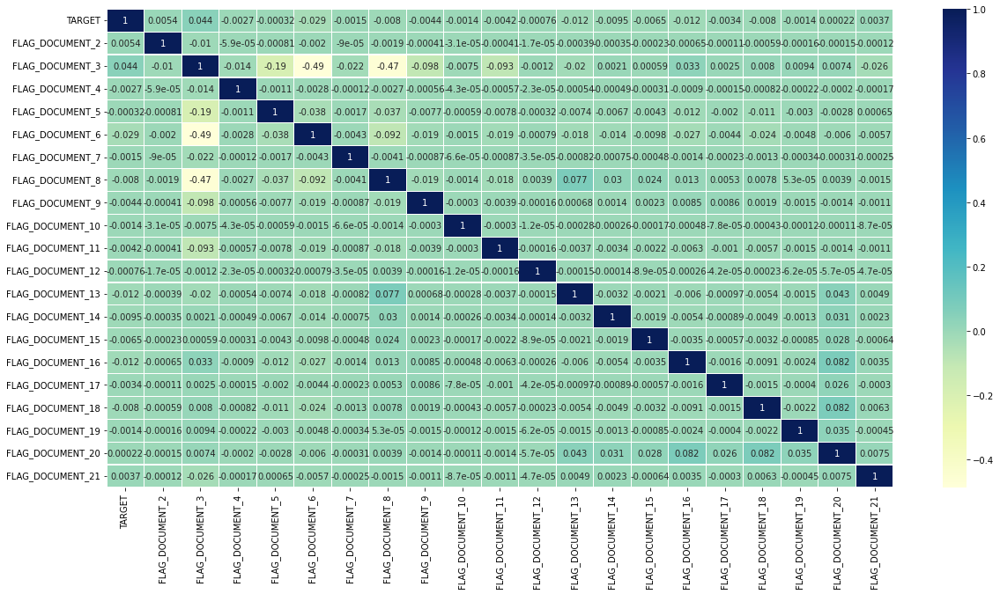

In [ ]:
# Calculate correlations
corr = application_doc_corr.corr()
# Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr, annot=True, linewidths=.2, cmap="YlGnBu");

4 Korelasi terbesar terdapat pada variabel FLAG_DOCUMENT_3 di 0,044346, FLAG_DOCUMENT_6 di -0,028602, FLAG_DOCUMENT_16 di -0,011615, dan FLAG_DOCUMENT_13 di -0,011583. Oleh karena itu, kami hanya akan menyimpan FLAG_DOCUMENT_3, FLAG_DOCUMENT_6, FLAG_DOCUMENT_13, dan FLAG_DOCUMENT_16 dalam training dataset dan membuang 16 fitur FLAG_DOCUMENT lainnya.

In [ ]:
application_full = application_full.drop(['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
                        'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
                        'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
                        'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15'], axis=1)

In [ ]:
application_full['TARGET']= target

In [ ]:
application_full['SK_ID_CURR']= sk_id

In [ ]:
application_full['AGE']= age

In [ ]:
dataframebaru = application_full[['TARGET','NAME_CONTRACT_TYPE','CODE_GENDER','ORGANIZATION_TYPE','OCCUPATION_TYPE','NAME_FAMILY_STATUS','NAME_EDUCATION_TYPE','NAME_INCOME_TYPE','SK_ID_CURR','AMT_INCOME_TOTAL','AGE','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT','DAYS_LAST_PHONE_CHANGE','FLOORSMAX_AVG','DAYS_EMPLOYED','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3']]
print(dataframebaru)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
dataframebaru.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,ORGANIZATION_TYPE,OCCUPATION_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,AMT_INCOME_TOTAL,AGE,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,DAYS_LAST_PHONE_CHANGE,FLOORSMAX_AVG,DAYS_EMPLOYED,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
0,1,Cash loans,M,Business Entity Type 3,Laborers,Single / not married,Secondary / secondary special,Working,100002,202500.000,26,2,2,-1134.000,0.083,-637,0.083,0.263,0.139
1,0,Cash loans,F,School,Core staff,Married,Higher education,State servant,100003,270000.000,46,1,1,-828.000,0.292,-1188,0.311,0.622,NaN
2,0,Revolving loans,M,Government,Laborers,Single / not married,Secondary / secondary special,Working,100004,67500.000,52,2,2,-815.000,NaN,-225,NaN,0.556,0.730
3,0,Cash loans,F,Business Entity Type 3,Laborers,Civil marriage,Secondary / secondary special,Working,100006,135000.000,52,2,2,-617.000,NaN,-3039,NaN,0.650,NaN
4,0,Cash loans,M,Religion,Core staff,Single / not married,Secondary / secondary special,Working,100007,121500.000,55,2,2,-1106.000,NaN,-3038,NaN,0.323,NaN


In [ ]:
dataframebaru['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    252379
Higher education                  87379
Incomplete higher                 12001
Lower secondary                    4291
Academic degree                     205
Name: NAME_EDUCATION_TYPE, dtype: int64

In [ ]:
dataframebaru['NAME_FAMILY_STATUS'].value_counts()

Married                 228715
Single / not married     52480
Civil marriage           34036
Separated                22725
Widow                    18297
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = 'drive/MyDrive/Colab Notebooks/data/gds2.csv'
with open(path, 'w', encoding = 'utf-8-sig') as f:
  dataframebaru.to_csv(f)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
